In [1]:
from su2_element import SU2_element
import numpy as np
import matplotlib.pyplot as plt
plt.style.use(['science', 'notebook', 'grid']) #dependency: SciencePlots
from fibonacci import generate_vertices, generate_vertices_angles
from lattice_optimisation import lattice_optimizer, angles_to_cartesian
from linear_discetisation import Linear_disc_points
from genz_recreate import gen_all_points
from commutators import test_angular_momentum_comutator, fourier_vector, calc_r, La_Lb_commutator
from lattice_actions import calc_mean_distance
from derivative import angular_momentum, new_angular_momentum, new_angular_momentum_sparce
import os
path = "lattices\\better_optimistion01"
def get_lattices(min = 1, max = 2**22, lst=None):
    lattices = []
    for file in os.listdir(path):
        if file.endswith(".npy"):
            if lst != None:
                if int(file[9:-4]) in lst:
                    lattices.append(np.load(f"{path}\\{file}"))
            elif int(file[9:-4])> min and int(file[9:-4]) < max:
                lattices.append(np.load(f"{path}\\{file}"))
    lattices.sort(key=len)
    return lattices
opt_lattices = get_lattices()
a = np.loadtxt(f"{path}\\means.txt")

In [3]:
sizes = [len(elem) for elem in opt_lattices]
means = [calc_mean_distance(elem) for elem in opt_lattices]

In [4]:
a = np.loadtxt(f"{path}\\means.txt")

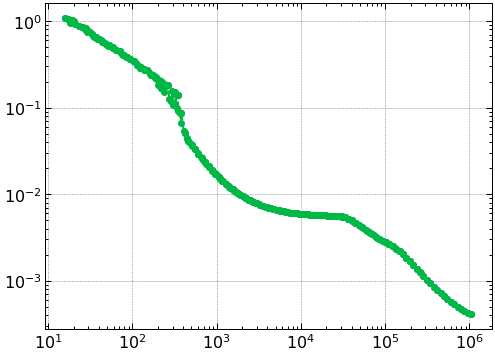

In [6]:
plt.plot(a.T[0], a.T[1], "o")
plt.plot(sizes, means, "o--")
plt.xscale("log")
plt.yscale("log")

In [30]:
num_of_points = np.arange(Start, End, dtype=int)
fib_Lattices = []
fib_angles = []
opt_Lattices = []

In [26]:
len(num_of_points)

1642

In [27]:
len(fib_Lattices)

0

In [31]:
for i, num in enumerate(num_of_points):
    if i % 50 == 0:
        print(i/(len(num_of_points)-1)*100, "%")
    fib_angles.append(generate_vertices_angles(num))
    fib_Lattices.append(angles_to_cartesian(fib_angles[i]))
    np.savetxt(f"lattices\\all_them_lattices\\fib_{num}.csv", fib_Lattices[i], delimiter="\t", newline="\n",fmt="%.13e")
    opt_Lattices.append(angles_to_cartesian(lattice_optimizer(fib_angles[i], eps = 1e-10)[0]))
    np.savetxt(f"lattices\\all_them_lattices\\opt_{num}.csv", opt_Lattices[i], delimiter="\t", newline="\n",fmt="%.13e")
    


0.0 %
3.0469226081657528 %
6.0938452163315056 %
9.140767824497258 %
12.187690432663011 %
15.234613040828762 %
18.281535648994517 %
21.328458257160268 %
24.375380865326022 %
27.422303473491773 %
30.469226081657524 %
33.516148689823275 %
36.56307129798903 %
39.609993906154784 %
42.656916514320535 %
45.703839122486286 %
48.750761730652044 %
51.797684338817795 %
54.844606946983546 %
57.891529555149305 %
60.93845216331505 %
63.98537477148081 %
67.03229737964655 %
70.07921998781231 %
73.12614259597807 %
76.17306520414382 %
79.21998781230957 %
82.26691042047533 %
85.31383302864107 %
88.36075563680681 %
91.40767824497257 %
94.45460085313833 %
97.50152346130409 %


In [36]:
mean_fib = np.zeros(len(fib_Lattices))
mean_opt = np.zeros(len(opt_Lattices))

for index, (fib, opt) in enumerate(zip(fib_Lattices,opt_Lattices)):
    if index % 50 ==0:
        print(index/(len(fib_Lattices)-1)*100, "%")
    mean_fib[index] = calc_mean_distance(fib)
    mean_opt[index] = calc_mean_distance(opt)
np.savetxt(f"lattices\\all_them_means\\fib.csv", np.column_stack((num_of_points, mean_fib)), delimiter="\t", newline="\n",fmt="%.13e")
np.savetxt(f"lattices\\all_them_means\\opt.csv", np.column_stack((num_of_points, mean_fib)), delimiter="\t", newline="\n",fmt="%.13e")

0.0 %
3.0469226081657528 %
6.0938452163315056 %
9.140767824497258 %
12.187690432663011 %
15.234613040828762 %
18.281535648994517 %
21.328458257160268 %
24.375380865326022 %
27.422303473491773 %
30.469226081657524 %
33.516148689823275 %
36.56307129798903 %
39.609993906154784 %
42.656916514320535 %
45.703839122486286 %
48.750761730652044 %
51.797684338817795 %
54.844606946983546 %
57.891529555149305 %
60.93845216331505 %
63.98537477148081 %
67.03229737964655 %
70.07921998781231 %
73.12614259597807 %
76.17306520414382 %
79.21998781230957 %
82.26691042047533 %
85.31383302864107 %
88.36075563680681 %
91.40767824497257 %
94.45460085313833 %
97.50152346130409 %


ValueError: Expected 1D or 2D array, got 0D array instead

In [59]:

Start = 128
End = 1770
num_of_points = np.arange(Start, End, dtype=int)

# load lattice csv's
fib_Lattices = []
opt_Lattices = []

for i, num in enumerate(num_of_points):
    if i % 100 == 0:
        print(i/(len(num_of_points)-1)*100, "%")
    fib_Lattices.append(np.loadtxt(f"lattices\\all_them_lattices\\fib_{num}.csv", delimiter="\t"))
    opt_Lattices.append(np.loadtxt(f"lattices\\all_them_lattices\\opt_{num}.csv", delimiter="\t"))
    
# load lattice means

mean_fib = np.loadtxt(f"lattices\\all_them_means\\fib.csv", delimiter="\t").T[1].T
mean_opt = np.loadtxt(f"lattices\\all_them_means\\opt.csv", delimiter="\t").T[1].T


0.0 %
6.0938452163315056 %
12.187690432663011 %
18.281535648994517 %
24.375380865326022 %
30.469226081657524 %
36.56307129798903 %
42.656916514320535 %
48.750761730652044 %
54.844606946983546 %
60.93845216331505 %
67.03229737964655 %
73.12614259597807 %
79.21998781230957 %
85.31383302864107 %
91.40767824497257 %
97.50152346130409 %


In [63]:
a = 3

ks = np.array([[0,0,0],[0.01,0,0],[0.05,0,0],[0.1,0,0]])
fib_res = np.zeros((ks.shape[0], len(fib_Lattices)))
opt_res = np.zeros((ks.shape[0], len(opt_Lattices)))


for index, (fib,opt) in enumerate(zip(fib_Lattices,opt_Lattices)):
    if index % 50 == 0:
        print(index/(len(fib_Lattices)-1)*100, "%")
    fib_comm = La_Lb_commutator(fib, a, 1, ang = new_angular_momentum)
    opt_comm = La_Lb_commutator(opt, a, 1, ang = new_angular_momentum)
    for i_k, k in enumerate(ks):
        fib_vec = fourier_vector(fib, a, k)
        opt_vec = fourier_vector(opt, a, k)
        fib_res[i_k, index] = calc_r(fib_comm, vec=fib_vec)
        opt_res[i_k, index] = calc_r(opt_comm, vec=opt_vec)

0.0 %
3.0469226081657528 %
6.0938452163315056 %
9.140767824497258 %
12.187690432663011 %
15.234613040828762 %
18.281535648994517 %
21.328458257160268 %
24.375380865326022 %
27.422303473491773 %
30.469226081657524 %
33.516148689823275 %
36.56307129798903 %
39.609993906154784 %
42.656916514320535 %
45.703839122486286 %
48.750761730652044 %
51.797684338817795 %
54.844606946983546 %
57.891529555149305 %
60.93845216331505 %
63.98537477148081 %
67.03229737964655 %
70.07921998781231 %
73.12614259597807 %
76.17306520414382 %
79.21998781230957 %
82.26691042047533 %
85.31383302864107 %
88.36075563680681 %
91.40767824497257 %
94.45460085313833 %
97.50152346130409 %


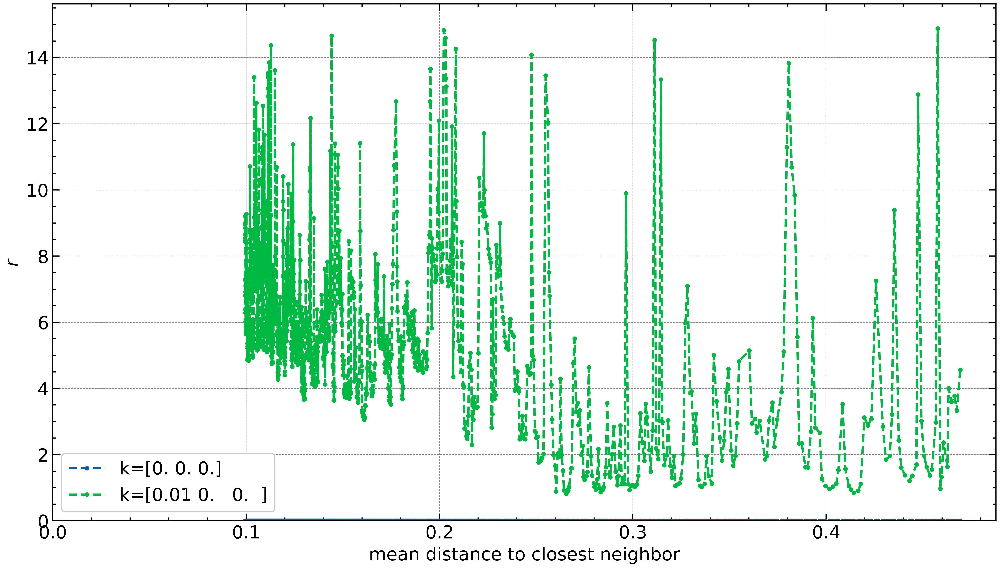

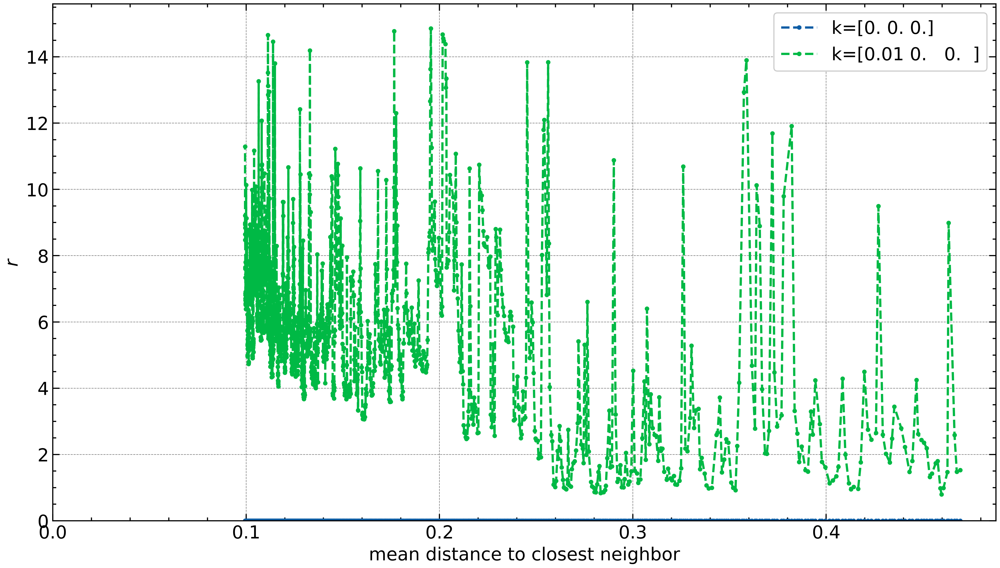

In [73]:

for str in ["fib", "opt"]:
    fig, axes = plt.subplots(1,1,figsize=(6.01299213 * 2.5,2.5 * 4.5/8 * 6.01299213), dpi=540)
    for i_k, _ in enumerate(ks[:2]):
        if str == "fib":
            axes.plot(mean_fib[fib_res[i_k,:]<15], fib_res[i_k,fib_res[i_k,:]<15],".--",label=f"k={ks[i_k]}")
        else:
            axes.plot(mean_opt[opt_res[i_k,:]<15], opt_res[i_k,opt_res[i_k,:]<15],".--",label=f"k={ks[i_k]}")
    axes.legend(loc="best")
    axes.set_xlabel("mean distance to closest neighbor")
    axes.set_ylabel(r"$r$")
    plt.xlim(left=0)
    plt.ylim(bottom=0)

    plt.savefig(f"{str}_1n_LaLb_all_the_points.pdf")

In [74]:
fib_res_perm = fib_res.copy()
opt_res_perm = opt_res.copy()

In [76]:
a = 3
angs = np.array([angular_momentum, new_angular_momentum])


ks = np.array([[0,0,0],[0.1,0,0],[0.5,0,0],[1,0,0]])
fib_res_n = np.zeros((angs.shape[0],ks.shape[0], len(fib_Lattices)))
opt_res_n = np.zeros((angs.shape[0],ks.shape[0], len(opt_Lattices)))

for i, ang in enumerate(angs):
    for index, (fib,opt) in enumerate(zip(fib_Lattices,opt_Lattices)):
        if index % 50 == 0:
            print(index/(len(fib_Lattices)-1)*100, "%")
        fib_comm = test_angular_momentum_comutator(fib, a, i=1, j=1, n=2, ang=ang)
        opt_comm = test_angular_momentum_comutator(opt, a, i=1, j=1, n=2, ang=ang)
        for i_k, k in enumerate(ks):
            fib_vec = fourier_vector(fib, a, k)
            opt_vec = fourier_vector(opt, a, k)
            fib_res_n[i, i_k, index] = calc_r(fib_comm, vec=fib_vec)
            opt_res_n[i, i_k, index] = calc_r(opt_comm, vec=opt_vec)

0.0 %
3.0469226081657528 %
6.0938452163315056 %
9.140767824497258 %
12.187690432663011 %
15.234613040828762 %
18.281535648994517 %
21.328458257160268 %
24.375380865326022 %
27.422303473491773 %
30.469226081657524 %
33.516148689823275 %
36.56307129798903 %
39.609993906154784 %
42.656916514320535 %
45.703839122486286 %
48.750761730652044 %
51.797684338817795 %
54.844606946983546 %
57.891529555149305 %
60.93845216331505 %
63.98537477148081 %
67.03229737964655 %
70.07921998781231 %
73.12614259597807 %
76.17306520414382 %
79.21998781230957 %
82.26691042047533 %
85.31383302864107 %
88.36075563680681 %
91.40767824497257 %
94.45460085313833 %
97.50152346130409 %
0.0 %
3.0469226081657528 %
6.0938452163315056 %
9.140767824497258 %
12.187690432663011 %
15.234613040828762 %
18.281535648994517 %
21.328458257160268 %
24.375380865326022 %
27.422303473491773 %
30.469226081657524 %
33.516148689823275 %
36.56307129798903 %
39.609993906154784 %
42.656916514320535 %
45.703839122486286 %
48.750761730652044

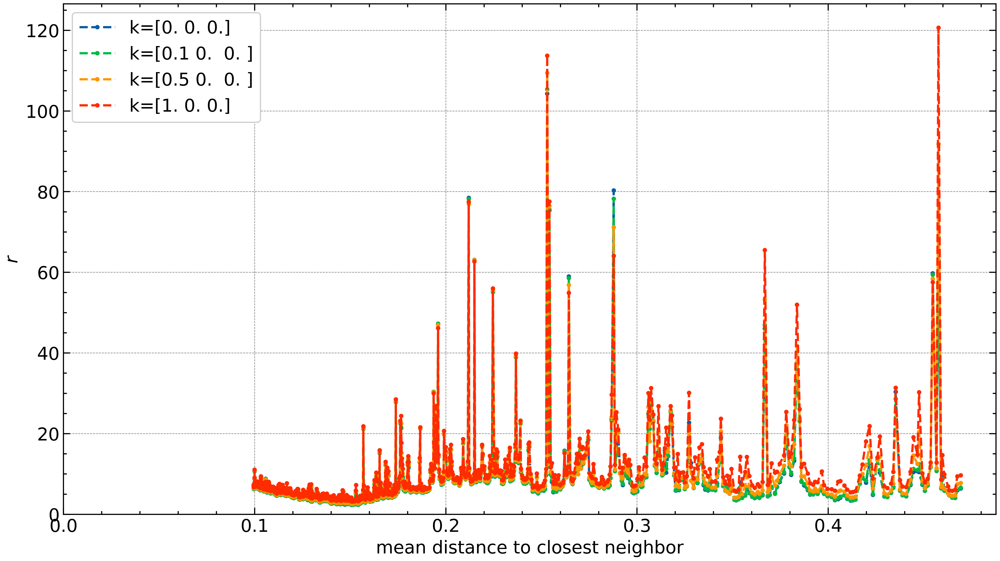

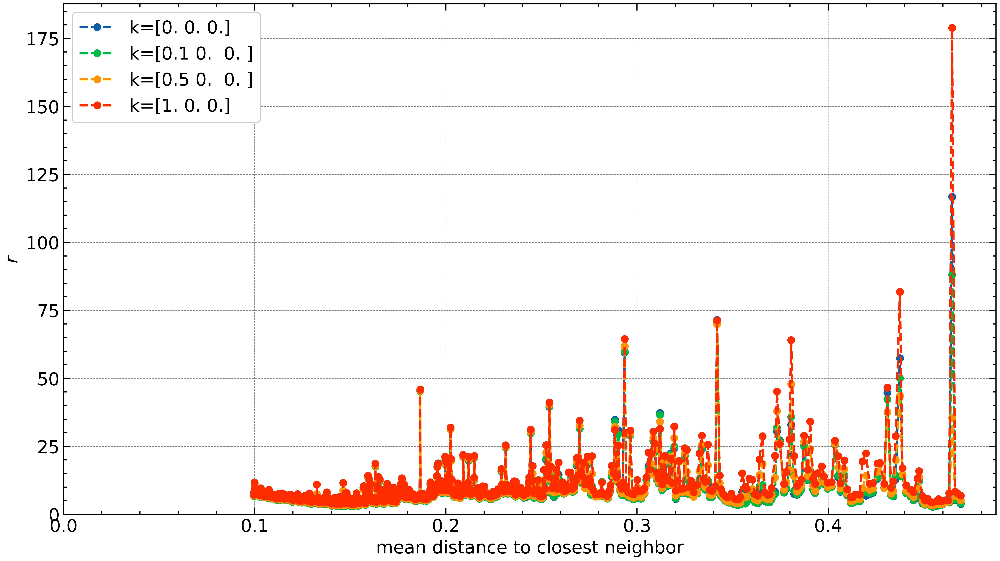

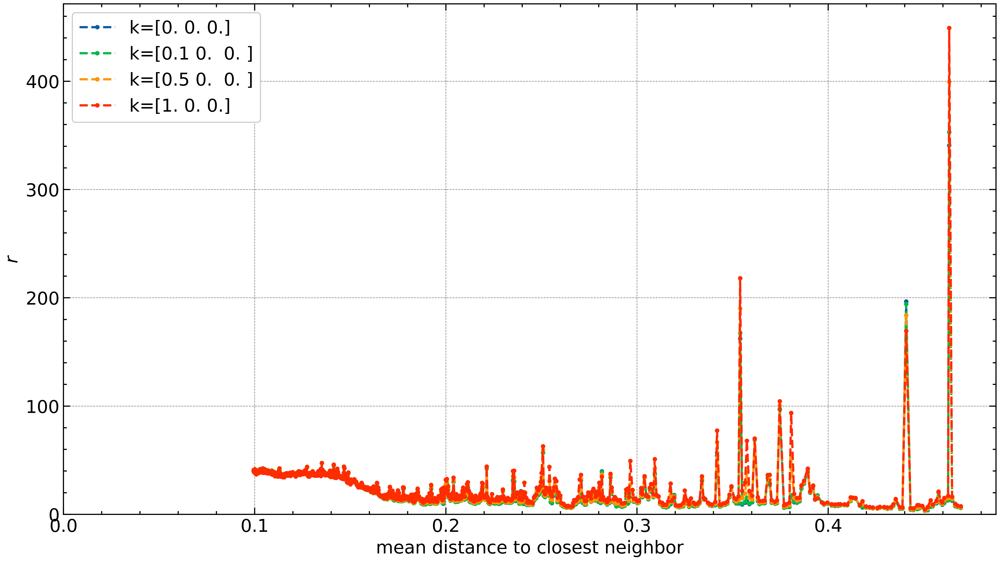

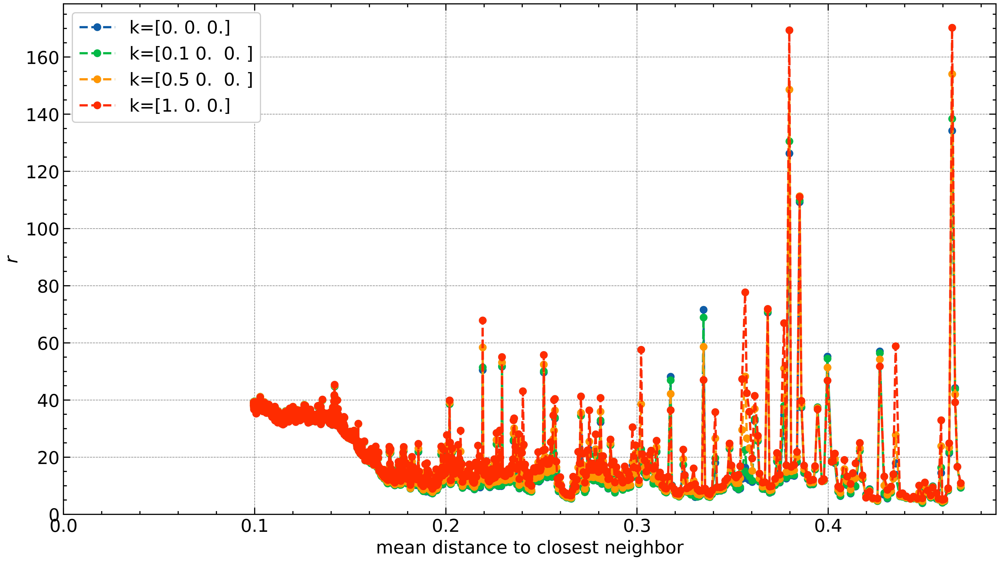

In [78]:

for i, _ in enumerate(angs):
    for str in ["fib", "opt"]:
        fig, axes = plt.subplots(1,1,figsize=(6.01299213 * 2.5,2.5 * 4.5/8 * 6.01299213), dpi=540)
        for i_k, _ in enumerate(ks[:]):
            if str == "fib":
                axes.plot(mean_fib, fib_res_n[i,i_k,:],".--",label=f"k={ks[i_k]}")
            else:
                axes.plot(mean_opt, opt_res_n[i,i_k,:],"o--",label=f"k={ks[i_k]}")
        axes.legend(loc="best")
        axes.set_xlabel("mean distance to closest neighbor")
        axes.set_ylabel(r"$r$")
        plt.xlim(left=0)
        plt.ylim(bottom=0)
        if i == 1:
            plt.savefig(f"{str}_2n_all_the_points_new.pdf")
        else:
            plt.savefig(f"{str}_2n_all_the_points_old.pdf")

In [79]:
a = 3

ks = np.array([[0,0,0],[0.1,0,0],[0.5,0,0],[1,0,0]])
fib_res_2 = np.zeros((angs.shape[0], ks.shape[0], len(fib_Lattices)))
opt_res_2 = np.zeros((angs.shape[0], ks.shape[0], len(opt_Lattices)))

for i, ang in enumerate(angs):
    for index, (fib,opt) in enumerate(zip(fib_Lattices,opt_Lattices)):
        if index % 50 == 0:
            print(index/(len(fib_Lattices)-1)*100, "%")
        fib_comm = La_Lb_commutator(fib, a, 1,n = 2, ang = ang)
        opt_comm = La_Lb_commutator(opt, a, 1,n = 2, ang = ang)
        for i_k, k in enumerate(ks):
            fib_vec = fourier_vector(fib, a, k)
            opt_vec = fourier_vector(opt, a, k)
            fib_res_2[i, i_k, index] = calc_r(fib_comm, vec=fib_vec)
            opt_res_2[i, i_k, index] = calc_r(opt_comm, vec=opt_vec)

0.0 %
3.0469226081657528 %
6.0938452163315056 %
9.140767824497258 %
12.187690432663011 %
15.234613040828762 %
18.281535648994517 %
21.328458257160268 %
24.375380865326022 %
27.422303473491773 %
30.469226081657524 %
33.516148689823275 %
36.56307129798903 %
39.609993906154784 %
42.656916514320535 %
45.703839122486286 %
48.750761730652044 %
51.797684338817795 %
54.844606946983546 %
57.891529555149305 %
60.93845216331505 %
63.98537477148081 %
67.03229737964655 %
70.07921998781231 %
73.12614259597807 %
76.17306520414382 %
79.21998781230957 %
82.26691042047533 %
85.31383302864107 %
88.36075563680681 %
91.40767824497257 %
94.45460085313833 %
97.50152346130409 %
0.0 %
3.0469226081657528 %
6.0938452163315056 %
9.140767824497258 %
12.187690432663011 %
15.234613040828762 %
18.281535648994517 %
21.328458257160268 %
24.375380865326022 %
27.422303473491773 %
30.469226081657524 %
33.516148689823275 %
36.56307129798903 %
39.609993906154784 %
42.656916514320535 %
45.703839122486286 %
48.750761730652044

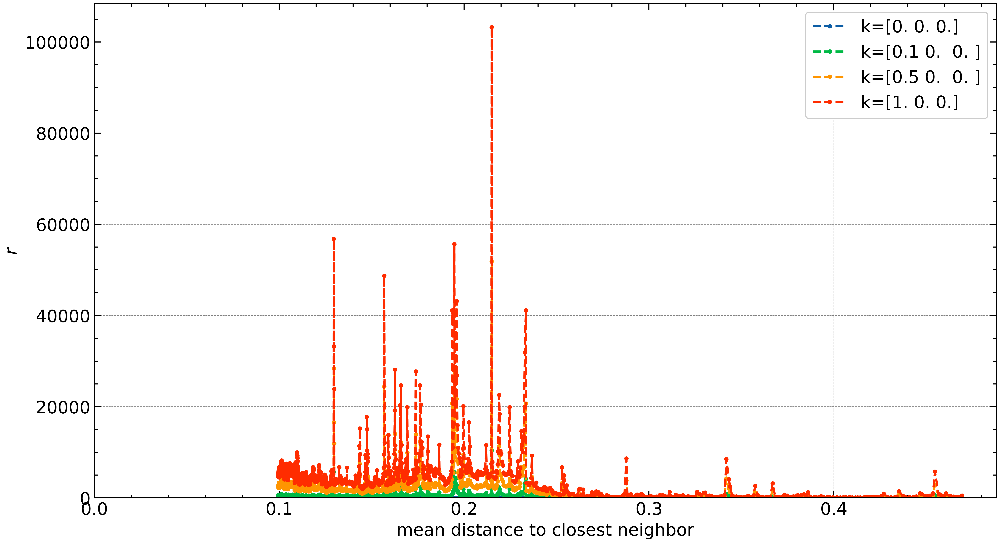

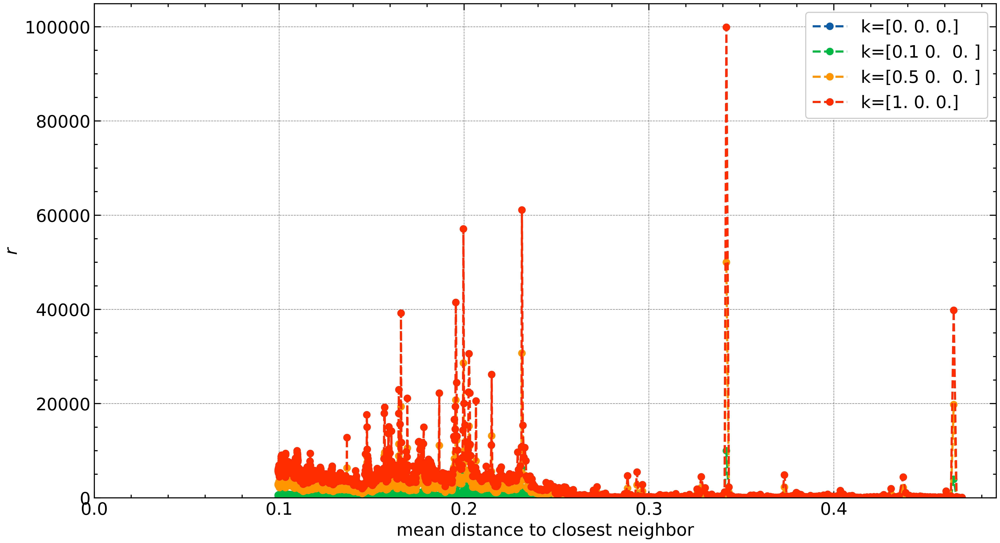

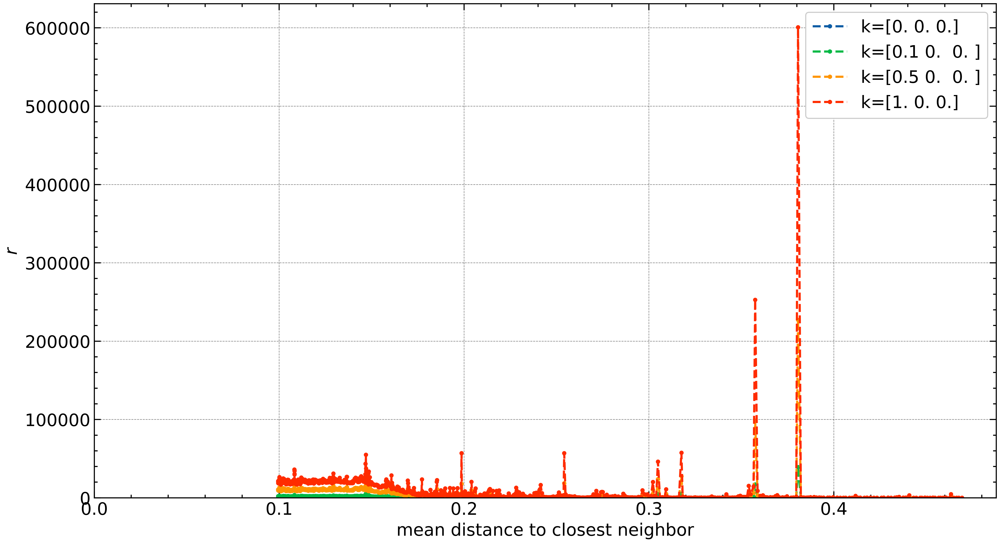

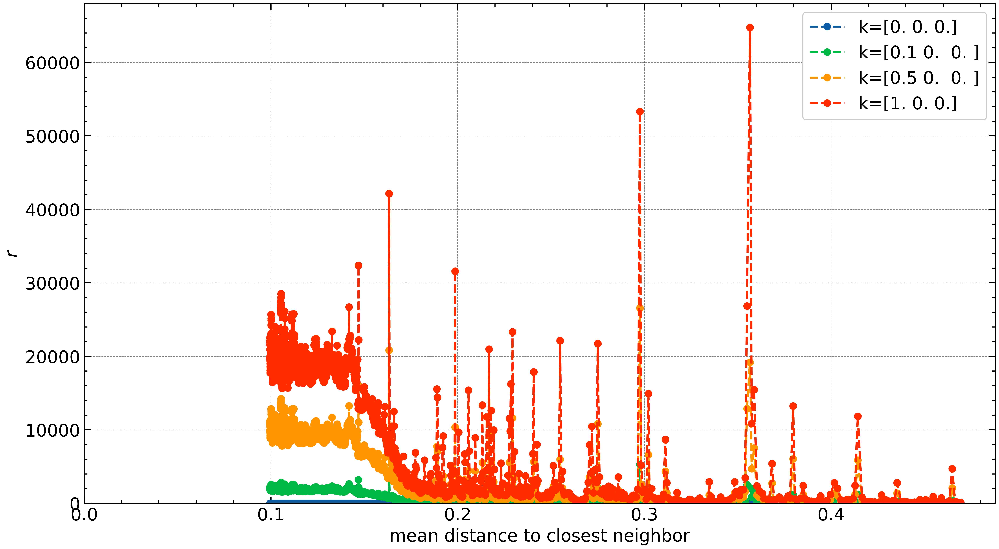

In [81]:

for i, _ in enumerate(angs):
    for str in ["fib", "opt"]:
        fig, axes = plt.subplots(1,1,figsize=(6.01299213 * 2.5,2.5 * 4.5/8 * 6.01299213), dpi=540)
        for i_k, _ in enumerate(ks[:]):
            if str == "fib":
                axes.plot(mean_fib, fib_res_2[i, i_k,:],".--",label=f"k={ks[i_k]}")
            else:
                axes.plot(mean_opt, opt_res_2[i, i_k,:],"o--",label=f"k={ks[i_k]}")
        axes.legend(loc="best")
        axes.set_xlabel("mean distance to closest neighbor")
        axes.set_ylabel(r"$r$")
        plt.xlim(left=0)
        plt.ylim(bottom=0)
        if i == 1:
                plt.savefig(f"{str}_2n_LaLb_all_the_points_new.pdf")
        else:
                plt.savefig(f"{str}_2n_LaLb_all_the_points_old.pdf")